In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import MDAnalysis as md
from MDAnalysis.analysis.rms import rmsd
from MDAnalysis.analysis import align
from shapeGMM import gmm_shapes
import sys
import pyemma

# Load Trajectory

In [66]:
#load in Trp-cage trajectory data
prmtopFileName = "trp-cage-2jof_350K.run.3650000000.part0146.nowater.gro"
trajFileName = "trp-cage-2jof_350K.stepid10150000000.every1ns.nowater.align.xtc"

coord = md.Universe(prmtopFileName,trajFileName)

print("Number of atoms in trajectory:", coord.atoms.n_atoms)
print("Number of frames in trajectory:", coord.trajectory.n_frames)
# make atom selection
CAatomSel = coord.select_atoms('name CA')
print("Number of atoms in selection:", CAatomSel.n_atoms)
# create traj data of selection
trajData = np.empty((coord.trajectory.n_frames,CAatomSel.n_atoms,3),dtype=float)

#loop traj
for ts in coord.trajectory:
    trajData[ts.frame,:,:] = CAatomSel.positions - CAatomSel.center_of_geometry()

Number of atoms in trajectory: 284
Number of frames in trajectory: 20225
Number of atoms in selection: 20


# Perform Cluster Scan

In [3]:
import time
def weighted_cross_validate_cluster_scan(traj_data, n_train_frames, cluster_array = np.arange(2,9,1).astype(int), n_training_sets=10, n_attempts = 5):
    """
    perform cross validation weighted shape-GMM for range of cluster sizes
    Inputs:
        traj_data                  (required)  : float64 array with dimensions (n_frames, n_atoms,3) of molecular configurations
        n_train_frames             (required)  : int     scalar dictating number of frames to use as training (rest is used for CV)
        cluster_array       (default: [2..8])  : int     array of cluster sizes - can be of any number but must be ints. Default is [2, 3, 4, 5, 6, 7, 8]
        n_training_sets         (default: 10)  : int     scalar dictating how many training sets to choose. Default is 10
        n_attempts               (default: 5)  : int     scalar dictating how many attempts to perform shape-GMM on same set.  Default is 5
    Returns:
        weighted_train_log_lik                 : float64 array with dimensions (n_clusters, n_training_sets) containing log likelihoods for each training set
        weighted_predict_log_lik               : float64 array with dimensions (n_clusters, n_training_sets) containing log likelihoods on each CV set
    """
    # meta data from input array
    n_frames = traj_data.shape[0]
    # set parameters
    n_predict_frames = n_frames - n_train_frames
    print("Number of frames to train each model:", n_train_frames)
    print("Number of frames to predict each model:", n_predict_frames)
    print("Number of training sets:", n_training_sets)
    print("Number of clusters:", cluster_array.size)
    print("Number of attempts per set/cluster:", n_attempts)
    sys.stdout.flush()
    # open data files
    weighted_train_log_lik = np.empty((cluster_array.size,n_training_sets),dtype=np.float64)
    weighted_predict_log_lik = np.empty((cluster_array.size,n_training_sets),dtype=np.float64)
    # print log info
    print("%15s %15s %15s %19s %15s" % ("Training Set", "N Clusters", "Attempt", "Log Like per Frame","CPU Time (s)"))
    print("%84s" % ("------------------------------------------------------------------------------------"))
    # loop over training sets
    for training_set in range(n_training_sets):
        # shuffle trajectory data
        np.random.shuffle(traj_data)
        # create training and predict data
        train_data = traj_data[:n_train_frames]
        predict_data = traj_data[n_train_frames:]
        # loop over all number of clusters
        for cluster_index, cluster_size in enumerate(cluster_array):
            w_log_lik = []
            w_objs = []
            # for each n_clusters and training set, perform shape-GMM n_attempts times and take object with largest log likelihood
            for attempt in range(n_attempts):
                start_time = time.process_time()
                wsgmm = gmm_shapes.ShapeGMM(cluster_size,kabsch_thresh=1e-1,init_cluster_method='random',init_iter=5)
                wsgmm.fit_weighted(train_data)
                w_log_lik.append(wsgmm.log_likelihood)
                w_objs.append(wsgmm)
                elapsed_time = time.process_time()-start_time
                print("%15d %15d %15d %19.3f %15.3f" % (training_set+1, cluster_size, attempt+1, np.round(wsgmm.log_likelihood/wsgmm.n_frames,3), np.round(elapsed_time,3)))
            # determine maximum
            w_arg = np.argmax(w_log_lik)
            # save training log likes
            weighted_train_log_lik[cluster_index,training_set] = w_log_lik[w_arg]
            # save prediction log likes
            weighted_predict_log_lik[cluster_index,training_set] = w_objs[w_arg].predict_weighted(predict_data)[2]

    # convert to log likelihood per frame
    weighted_train_log_lik /= n_train_frames
    weighted_predict_log_lik /= n_predict_frames
    #return
    return weighted_train_log_lik, weighted_predict_log_lik

In [4]:
# define cluster array
cluster_array = np.arange(2,9,1).astype(int)

In [8]:
# run cluster CV scan
# NOTE: This will take a few hours
weighted_train_log_lik, weighted_predict_log_lik = weighted_cross_validate_cluster_scan(np.copy(trajData),5000,cluster_array = cluster_array, n_training_sets=5, n_attempts=10)

Number of frames to train each model: 5000
Number of frames to predict each model: 15225
Number of training sets: 5
Number of clusters: 7
Number of attempts per set/cluster: 10
   Training Set      N Clusters         Attempt  Log Like per Frame    CPU Time (s)
------------------------------------------------------------------------------------
              1               2               1               9.135          62.221
              1               2               2               9.135          91.536
              1               2               3               9.135          79.620
              1               2               4               9.135          83.822
              1               2               5               9.135          78.619
              1               2               6               9.135          96.079
              1               2               7               9.135          83.060
              1               2               8               9.13

              2               4               5              12.715         122.730
              2               4               6              12.142         296.584
              2               4               7              12.715         118.634
              2               4               8              12.715         140.986
              2               4               9              12.339         169.289
              2               4              10              12.890         100.760
              2               5               1              14.076         233.098
              2               5               2              13.592         272.084
              2               5               3              12.934         195.256
              2               5               4              14.076         215.043
              2               5               5              14.240         150.662
              2               5               6              14.076         

              3               7               3              15.826         415.954
              3               7               4              15.860         191.707
              3               7               5              15.791         159.022
              3               7               6              15.631         253.653
              3               7               7              15.807         228.217
              3               7               8              13.936         359.236
              3               7               9              15.450         251.497
              3               7              10              15.685         214.692
              3               8               1              16.001         349.571
              3               8               2              15.735         306.482
              3               8               3              16.056         304.569
              3               8               4              16.215         

              5               3               1              10.929          86.244
              5               3               2              10.984         100.600
              5               3               3              10.390         101.435
              5               3               4              10.929          60.834
              5               3               5              11.728          95.494
              5               3               6              10.390          90.253
              5               3               7              10.984          63.633
              5               3               8              10.929          76.898
              5               3               9              10.984          59.931
              5               3              10              10.929          68.110
              5               4               1              12.674         115.144
              5               4               2              11.231         

In [9]:
weighted_train_filename="weighted_train_5K_2_8.dat"
weighted_predict_filename="weighted_train_5K_predict_2_8.dat"
# write to data files
np.savetxt(weighted_train_filename,np.column_stack((cluster_array,weighted_train_log_lik)))
np.savetxt(weighted_predict_filename,np.column_stack((cluster_array,weighted_predict_log_lik)))

## Make plot

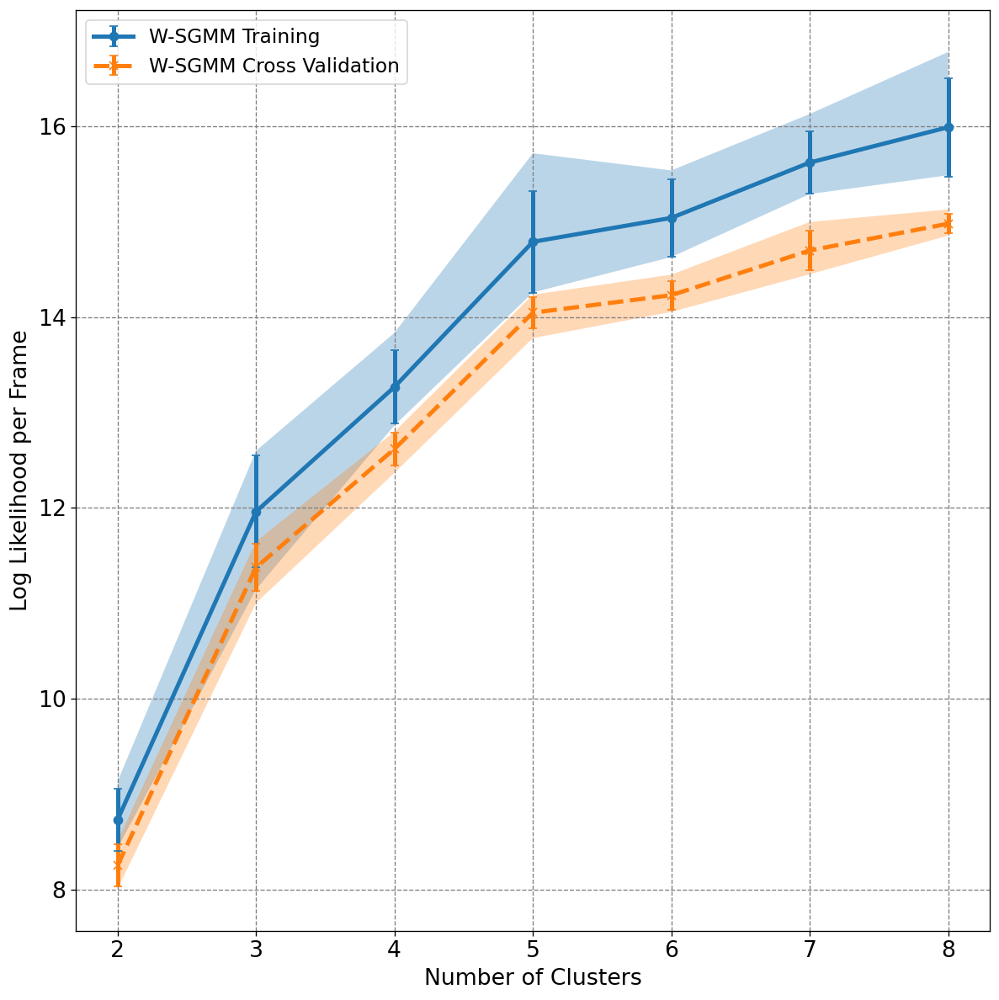

In [11]:
# create figure
plt.figure(figsize=(10,10), dpi= 120, facecolor='w', edgecolor='k')
# Training
weighted_train_mean = np.mean(weighted_train_log_lik,axis=1)
weighted_train_std = np.std(weighted_train_log_lik,axis=1)
plt.errorbar(cluster_array,weighted_train_mean,weighted_train_std,fmt='-o',lw=3,capsize=3,label="W-SGMM Training")
lower, upper = pyemma.util.statistics.confidence_interval((weighted_train_log_lik).T.tolist(), conf=0.9)
plt.fill_between(cluster_array, lower, upper, alpha=0.3)
# Cross Validation
weighted_predict_mean = np.mean(weighted_predict_log_lik,axis=1)
weighted_predict_std = np.std(weighted_predict_log_lik,axis=1)
plt.errorbar(cluster_array,weighted_predict_mean,weighted_predict_std,fmt='--x',lw=3,capsize=3,label="W-SGMM Cross Validation")
lower, upper = pyemma.util.statistics.confidence_interval((weighted_predict_log_lik).T.tolist(), conf=0.9)
plt.fill_between(cluster_array, lower, upper, alpha=0.3)
# set some stuff for the plot
plt.grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
plt.ylabel("Log Likelihood per Frame",fontsize=16)
plt.xlabel("Number of Clusters",fontsize=16)
plt.tick_params(axis='both',labelsize=16)
plt.legend(fontsize=14)
plt.tight_layout()

## Cluster again based on nClusters chosen above

In [30]:
n_clusters = 5
n_attempts = 10
delta = 10
objs = []
log_likes = []
for i in range(n_attempts):
    wsgmm = gmm_shapes.ShapeGMM(n_clusters,kabsch_thresh=1e-1,init_cluster_method='random',init_iter=5)
    wsgmm.fit_weighted(trajData[1::delta])
    log_likelihood = wsgmm.predict_weighted(trajData)[2]
    print(i+1, np.round(wsgmm.log_likelihood/wsgmm.n_frames,3), np.round(log_likelihood/trajData.shape[0],3))
    objs.append(wsgmm)
    log_likes.append(log_likelihood)
# select obj with max log likelihood per frame
wsgmm = objs[np.argmax(log_likes)]

1 14.64 12.849
2 14.505 12.557
3 15.681 13.798
4 13.194 11.348
5 14.642 12.848
6 12.904 10.962
7 15.0 13.202
8 13.029 11.315
9 14.404 12.604
10 14.715 12.835


In [ ]:
# save object
import pickle
pickle.dump(wsgmm,open("trpcage_wsgmm_5_clusters.pickle","wb"))

## Predict on entire of trajectory

In [67]:
clusters, aligned_traj, log_likelihood = wsgmm.predict_weighted(trajData)

In [19]:
np.unique(clusters,return_counts=True)

(array([0, 1, 2, 3, 4]), array([3240, 5183, 5632, 3318, 2852]))

# Check Clustering in 2D RMSD space

In [16]:
# create RMSD data of selections
trajRMSD_hx = np.empty(coord.trajectory.n_frames-1,dtype=float)
trajRMSD_3_10 = np.empty(coord.trajectory.n_frames-1,dtype=float)
hx = coord.select_atoms("name CA and resid 2:9")
h_3_10 = coord.select_atoms("name CA and resid 11:15")
# make first frame the reference (arbitrary but there you have it)
hx_ref = np.copy(hx.positions)
h_3_10_ref = np.copy(h_3_10.positions)
for ts in coord.trajectory[1::]:
    trajRMSD_hx[ts.frame-1] = rmsd(hx.positions,hx_ref,superposition=True)
    trajRMSD_3_10[ts.frame-1] = rmsd(h_3_10.positions,h_3_10_ref,superposition=True)

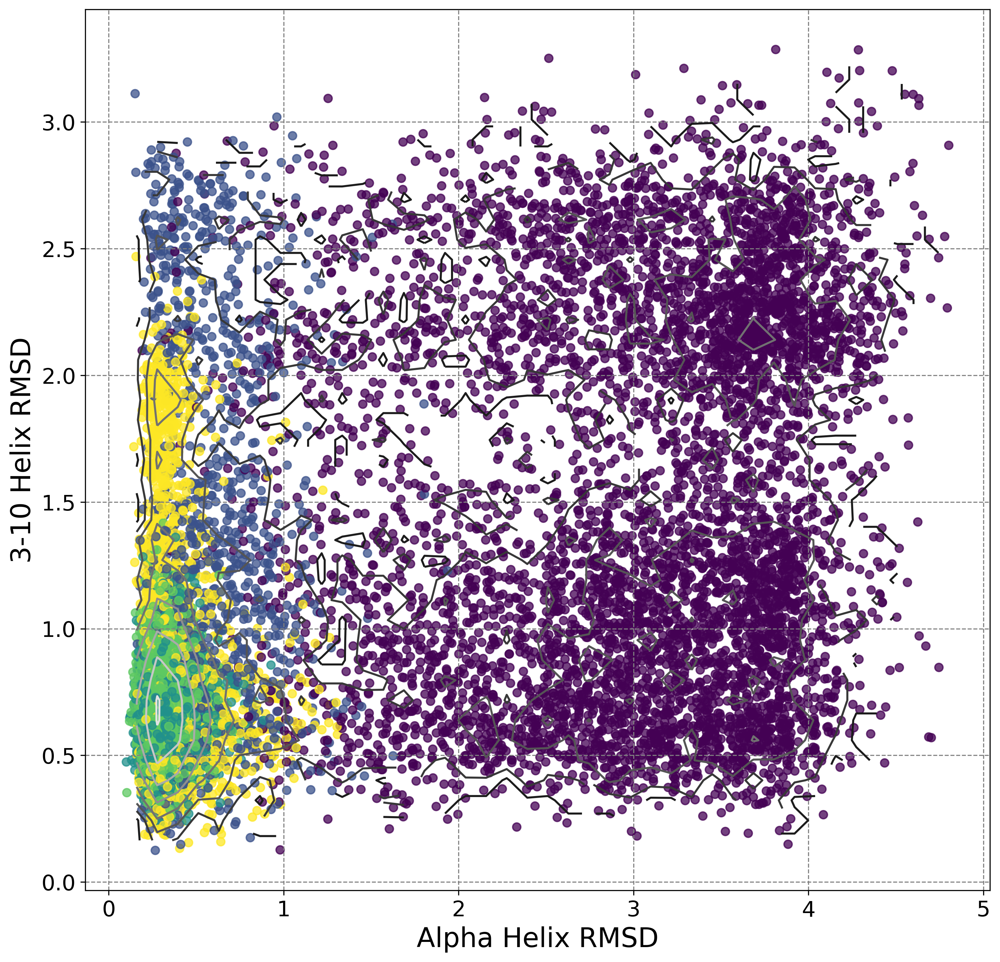

In [68]:
# plot data on LDA 1 and LDA 2 with points colored by cluster number
import matplotlib.cm as cm
plt.figure(figsize=(12, 12),dpi=300)
plt.xlabel("Alpha Helix RMSD",fontsize=20)
plt.ylabel("3-10 Helix RMSD",fontsize=20)
x = trajRMSD_hx
y = trajRMSD_3_10
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
plt.contour(xx,yy,H,cmap='binary')
plt.tick_params(axis='both',labelsize=16)
plt.grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
plt.scatter(trajRMSD_hx,trajRMSD_3_10,c=clusters[1:],alpha=0.75)

# Check Clustering in 2D Mahalanobis Distance Space

In [35]:
from shapeGMM import _traj_tools as traj_tools

In [38]:
print(wsgmm.weights)

[0.28381734 0.06580139 0.29141341 0.23796406 0.12100379]


In [36]:
# create Maha Distance array
traj_maha = np.empty((coord.trajectory.n_frames,wsgmm.n_clusters),dtype=float)
for coord_frame in range(coord.trajectory.n_frames):
    for cluster in range(wsgmm.n_clusters):
        traj_maha[coord_frame,cluster] = np.sqrt(traj_tools.weight_kabsch_dist(trajData[coord_frame],wsgmm.centers[cluster],wsgmm.precisions[cluster]))

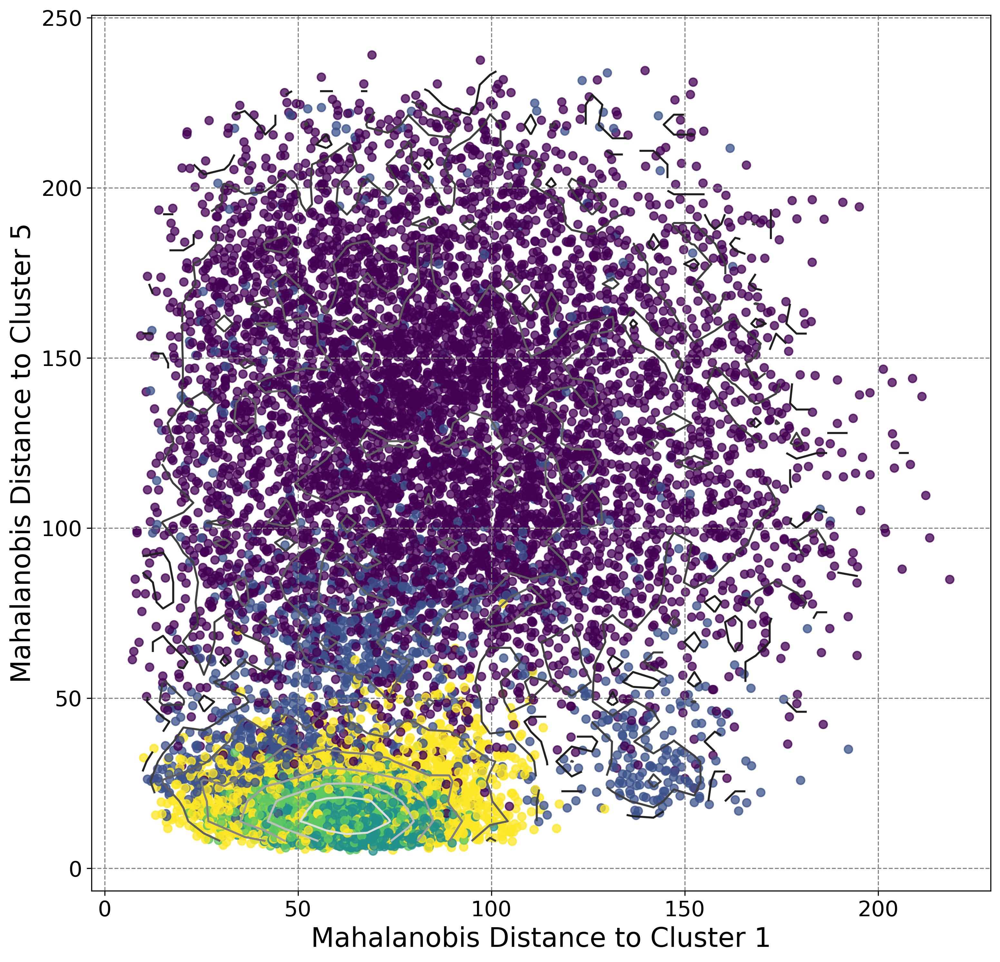

In [42]:
# plot data on LDA 1 and LDA 2 with points colored by cluster number
import matplotlib.cm as cm
plt.figure(figsize=(12, 12),dpi=300)
plt.xlabel("Mahalanobis Distance to Cluster 1",fontsize=20)
plt.ylabel("Mahalanobis Distance to Cluster 5",fontsize=20)
x = traj_maha[:,0]
y = traj_maha[:,4]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
plt.contour(xx,yy,H,cmap='binary')
plt.tick_params(axis='both',labelsize=16)
plt.grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
plt.scatter(x,y,c=clusters,alpha=0.75)

# Align Trajectory in a Variety of Ways

In [70]:
from shapeGMM import _traj_tools as traj_tools

In [71]:
# start with a global alignment of all frames using covariance weighted alignment (iterative)
# NOTE: This will take ~30 seconds
global_aligned_traj = traj_tools.traj_iterative_average_precision_weighted_kabsch(trajData)[0]

In [72]:
# Align to cluster 1 (non-iterative)
# NOTE: I have no idea which cluster is cluster 1
cluster_1_aligned_traj = traj_tools.traj_align_weighted_kabsch(trajData,wsgmm.centers[0],wsgmm.precisions[0])

In [73]:
# Align to cluster 2 (non-iterative)
# NOTE: I have no idea which cluster is cluster 2
cluster_2_aligned_traj = traj_tools.traj_align_weighted_kabsch(trajData,wsgmm.centers[1],wsgmm.precisions[1])

In [74]:
# Align to cluster 3 (non-iterative)
# NOTE: I have no idea which cluster is cluster 3
cluster_3_aligned_traj = traj_tools.traj_align_weighted_kabsch(trajData,wsgmm.centers[2],wsgmm.precisions[2])

In [75]:
# Align to cluster 4 (non-iterative)
# NOTE: I have no idea which cluster is cluster 4
cluster_4_aligned_traj = traj_tools.traj_align_weighted_kabsch(trajData,wsgmm.centers[3],wsgmm.precisions[3])

In [76]:
# Align to cluster 5 (non-iterative)
# NOTE: I have no idea which cluster is cluster 5
cluster_5_aligned_traj = traj_tools.traj_align_weighted_kabsch(trajData,wsgmm.centers[4],wsgmm.precisions[4])

# Linear Discriminant Analysis

In [51]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

(-9.0, 4.0)

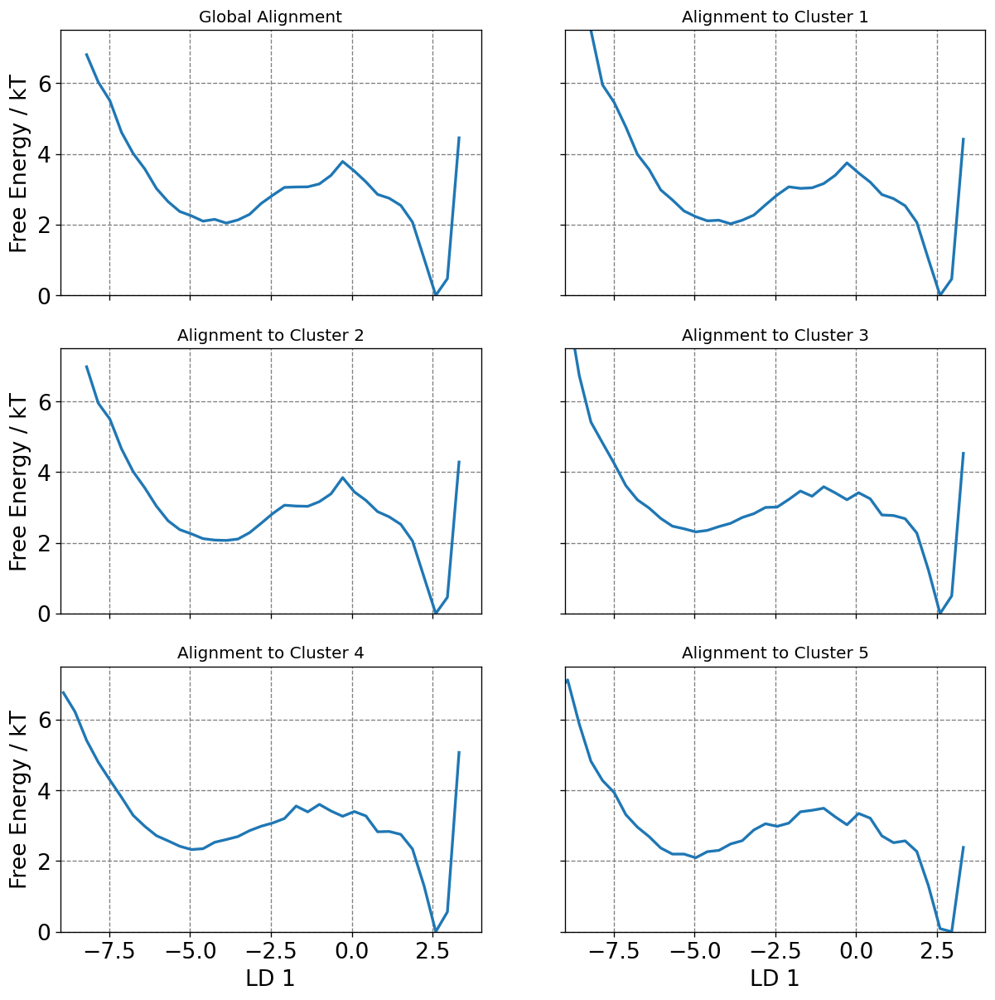

In [57]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12), dpi=120,sharey=True,sharex=True)
# 00
axes[0,0].set_title("Global Alignment")
axes[0,0].set_ylabel("Free Energy / kT",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_sgmm3 = lda.fit_transform(global_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_sgmm3[:,0],range=(-8,10),bins=50)[0])
axes[0,0].tick_params(axis='both',labelsize=16)
axes[0,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[0,0].plot(-np.arange(-8,10,0.36),fe-np.amin(fe),lw=2)
axes[0,0].set_ylim(0,7.5)
axes[0,0].set_xlim(-9,4)
# 01
axes[0,1].set_title("Alignment to Cluster 1")
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_1_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,0],range=(-8,10),bins=50)[0])
axes[0,1].tick_params(axis='both',labelsize=16)
axes[0,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[0,1].plot(-np.arange(-8,10,0.36),fe-np.amin(fe),lw=2)
axes[0,1].set_ylim(0,7.5)
axes[0,1].set_xlim(-10,3)
# 10
axes[1,0].set_title("Alignment to Cluster 2")
axes[1,0].set_ylabel("Free Energy / kT",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_2_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,0],range=(-8,10),bins=50)[0])
axes[1,0].tick_params(axis='both',labelsize=16)
axes[1,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[1,0].plot(-np.arange(-8,10,0.36),fe-np.amin(fe),lw=2)
axes[1,0].set_ylim(0,7.5)
axes[1,0].set_xlim(-10,3)
# 11
axes[1,1].set_title("Alignment to Cluster 3")
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_3_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,0],range=(-8,10),bins=50)[0])   # this one needs to be flipped
axes[1,1].tick_params(axis='both',labelsize=16)
axes[1,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[1,1].plot(-np.arange(-8,10,0.36),fe-np.amin(fe),lw=2)
axes[1,1].set_ylim(0,7.5)
axes[1,1].set_xlim(-10,3)
# 20
axes[2,0].set_title("Alignment to Cluster 4")
axes[2,0].set_xlabel("LD 1",fontsize=16)
axes[2,0].set_ylabel("Free Energy / kT",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_4_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,0],range=(-8,10),bins=50)[0])
axes[2,0].tick_params(axis='both',labelsize=16)
axes[2,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[2,0].plot(-np.arange(-8,10,0.36),fe-np.amin(fe),lw=2)
axes[2,0].set_ylim(0,7.5)
axes[2,0].set_xlim(-10,3)
# 21
axes[2,1].set_title("Alignment to Cluster 5")
axes[2,1].set_xlabel("LD 1",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_5_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,0],range=(-8,10),bins=50)[0])   # this one needs to be flipped
axes[2,1].tick_params(axis='both',labelsize=16)
axes[2,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[2,1].plot(-np.arange(-8,10,0.36),fe-np.amin(fe),lw=2)
axes[2,1].set_ylim(0,7.5)
axes[2,1].set_xlim(-9,4)

(-3.0, 3.0)

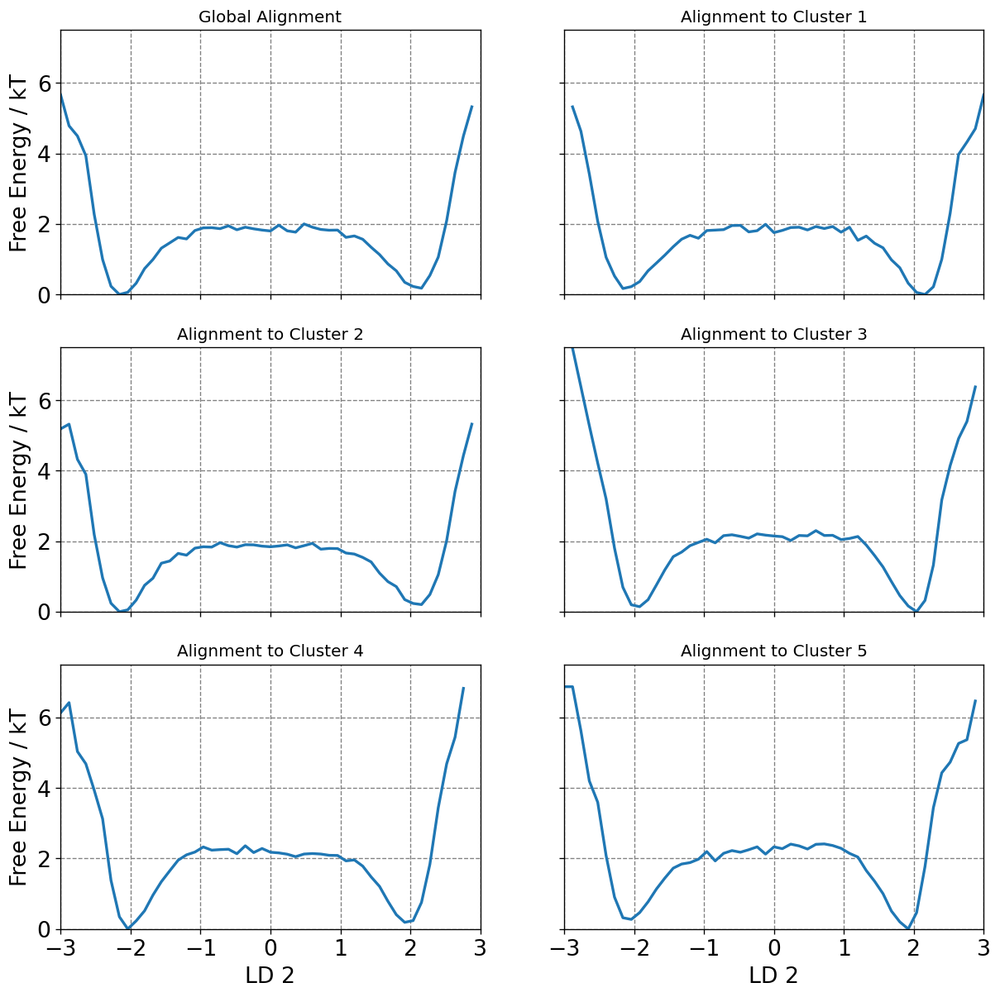

In [53]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12), dpi=120,sharey=True,sharex=True)
# 00
axes[0,0].set_title("Global Alignment")
axes[0,0].set_ylabel("Free Energy / kT",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_sgmm3 = lda.fit_transform(global_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_sgmm3[:,1],range=(-3,3),bins=50)[0])
axes[0,0].tick_params(axis='both',labelsize=16)
axes[0,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[0,0].plot(np.arange(-3,3,0.12),fe-np.amin(fe),lw=2)
axes[0,0].set_ylim(0,7.5)
axes[0,0].set_xlim(-3,3)
# 01
axes[0,1].set_title("Alignment to Cluster 1")
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_1_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,1],range=(-3,3),bins=50)[0])
axes[0,1].tick_params(axis='both',labelsize=16)
axes[0,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[0,1].plot(-np.arange(-3,3,0.12),fe-np.amin(fe),lw=2)
axes[0,1].set_ylim(0,7.5)
axes[0,1].set_xlim(-3,3)
# 10
axes[1,0].set_title("Alignment to Cluster 2")
axes[1,0].set_ylabel("Free Energy / kT",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_2_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,1],range=(-3,3),bins=50)[0])
axes[1,0].tick_params(axis='both',labelsize=16)
axes[1,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[1,0].plot(np.arange(-3,3,0.12),fe-np.amin(fe),lw=2)
axes[1,0].set_ylim(0,7.5)
axes[1,0].set_xlim(-3,3)
# 11
axes[1,1].set_title("Alignment to Cluster 3")
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_3_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,1],range=(-3,3),bins=50)[0])   # this one needs to be flipped
axes[1,1].tick_params(axis='both',labelsize=16)
axes[1,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[1,1].plot(-np.arange(-3,3,0.12),fe-np.amin(fe),lw=2)
axes[1,1].set_ylim(0,7.5)
axes[1,1].set_xlim(-3,3)
# 20
axes[2,0].set_title("Alignment to Cluster 4")
axes[2,0].set_xlabel("LD 2",fontsize=16)
axes[2,0].set_ylabel("Free Energy / kT",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_4_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,1],range=(-3,3),bins=50)[0])
axes[2,0].tick_params(axis='both',labelsize=16)
axes[2,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[2,0].plot(np.arange(-3,3,0.12),fe-np.amin(fe),lw=2)
axes[2,0].set_ylim(0,7.5)
axes[2,0].set_xlim(-3,3)
# 21
axes[2,1].set_title("Alignment to Cluster 5")
axes[2,1].set_xlabel("LD 2",fontsize=16)
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred_gmm3 = lda.fit_transform(cluster_5_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
fe = -np.log(np.histogram(y_pred_gmm3[:,1],range=(-3,3),bins=50)[0])   # this one needs to be flipped
axes[2,1].tick_params(axis='both',labelsize=16)
axes[2,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
axes[2,1].plot(np.arange(-3,3,0.12),fe-np.amin(fe),lw=2)
axes[2,1].set_ylim(0,7.5)
axes[2,1].set_xlim(-3,3)

(-5.0, 10.0)

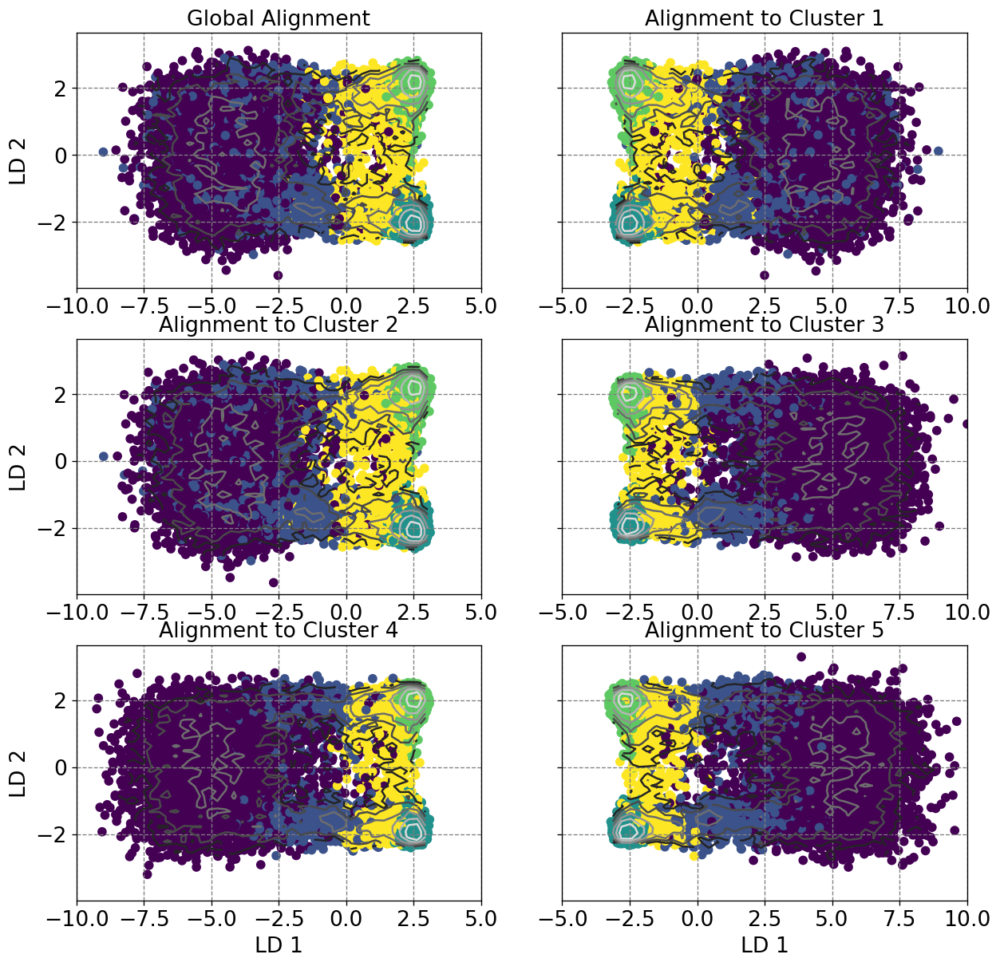

In [80]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12), dpi=120,sharey=True)
# 00
axes[0,0].set_title("Global Alignment",fontsize=16)
axes[0,0].set_ylabel("LD 2",fontsize=16)
axes[0,0].tick_params(axis='both',labelsize=16)
axes[0,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(global_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = -y_pred[:,0]
y = y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes[0,0].contour(xx,yy,H,cmap='binary')
axes[0,0].scatter(x,y,c=clusters)
axes[0,0].set_xlim(-10,5)
#01
axes[0,1].set_title("Alignment to Cluster 1",fontsize=16)
axes[0,1].tick_params(axis='both',labelsize=16)
axes[0,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(cluster_1_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = y_pred[:,0]
y = y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes[0,1].contour(xx,yy,H,cmap='binary')
axes[0,1].scatter(x,y,c=clusters)
axes[0,1].set_xlim(-5,10)
#10
axes[1,0].set_title("Alignment to Cluster 2",fontsize=16)
axes[1,0].set_ylabel("LD 2",fontsize=16)
axes[1,0].tick_params(axis='both',labelsize=16)
axes[1,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(cluster_2_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = -y_pred[:,0]
y = y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes[1,0].contour(xx,yy,H,cmap='binary')
axes[1,0].scatter(x,y,c=clusters)
axes[1,0].set_xlim(-10,5)
# 11
axes[1,1].set_title("Alignment to Cluster 3",fontsize=16)
axes[1,1].tick_params(axis='both',labelsize=16)
axes[1,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(cluster_3_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = y_pred[:,0]
y = -y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes[1,1].contour(xx,yy,H,cmap='binary')
axes[1,1].scatter(x,y,c=clusters)
axes[1,1].set_xlim(-5,10)
#20
axes[2,0].set_title("Alignment to Cluster 4",fontsize=16)
axes[2,0].set_ylabel("LD 2",fontsize=16)
axes[2,0].set_xlabel("LD 1",fontsize=16)
axes[2,0].tick_params(axis='both',labelsize=16)
axes[2,0].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(cluster_4_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = -y_pred[:,0]
y = y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes[2,0].contour(xx,yy,H,cmap='binary')
axes[2,0].scatter(x,y,c=clusters)
axes[2,0].set_xlim(-10,5)
# 21
axes[2,1].set_title("Alignment to Cluster 5",fontsize=16)
axes[2,1].set_xlabel("LD 1",fontsize=16)
axes[2,1].tick_params(axis='both',labelsize=16)
axes[2,1].grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(cluster_5_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = y_pred[:,0]
y = -y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes[2,1].contour(xx,yy,H,cmap='binary')
axes[2,1].scatter(x,y,c=clusters)
axes[2,1].set_xlim(-5,10)

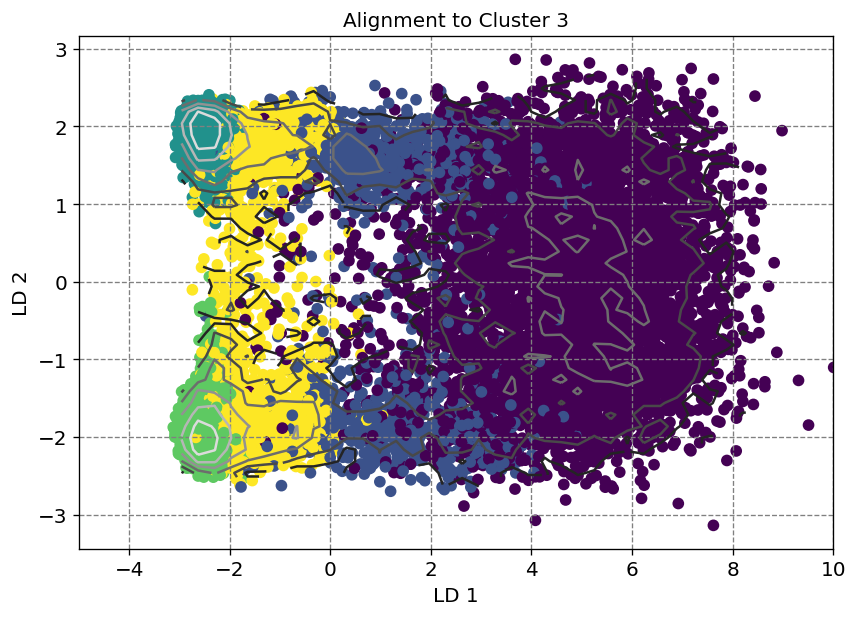

In [77]:
fig, axes = plt.subplots(1, 1, figsize=(7.25, 5.25), dpi=120,sharey=True)
axes.set_title("Alignment to Cluster 3",fontsize=12)
axes.tick_params(axis='both',labelsize=12)
axes.grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True)
y_pred = lda.fit_transform(cluster_3_aligned_traj.reshape(coord.trajectory.n_frames, CAatomSel.n_atoms*3), clusters)
x = y_pred[:,0]
y = y_pred[:,1]
H, xedges, yedges = np.histogram2d(x,y,bins=40,density=True)
xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
H = -np.log(H.T)
xx, yy = np.meshgrid(xcenters, ycenters)
axes.contour(xx,yy,H,cmap='binary')
axes.scatter(y_pred[:,0],y_pred[:,1],c=clusters)
axes.set_xlim(-5,10)
axes.set_ylabel("LD 2",fontsize=12)
axes.set_xlabel("LD 1",fontsize=12)
plt.tight_layout()

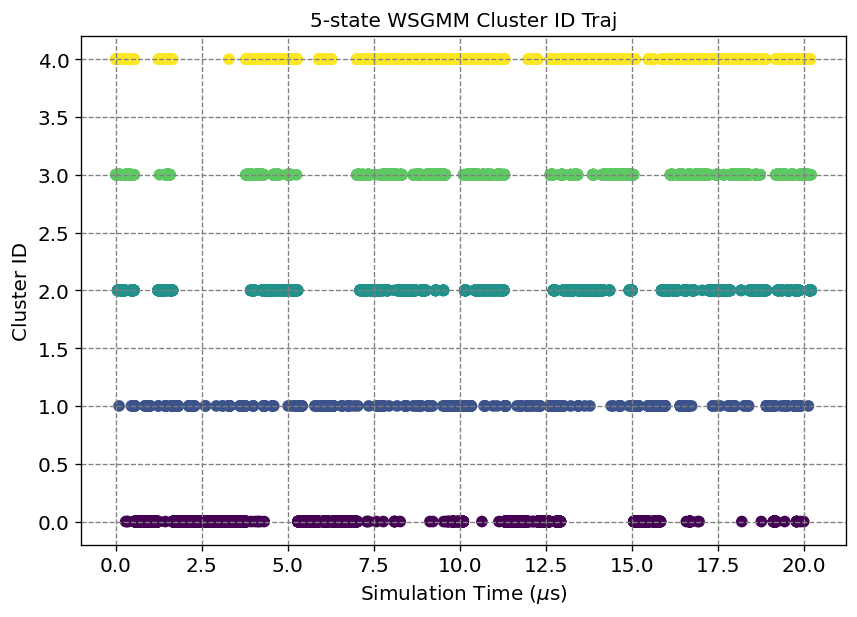

In [78]:
fig, axes = plt.subplots(1, 1, figsize=(7.25, 5.25), dpi=120,sharey=True)
axes.set_title("5-state WSGMM Cluster ID Traj",fontsize=12)
axes.tick_params(axis='both',labelsize=12)
axes.grid(b=True, which='major', axis='both', color='#808080', linestyle='--')
time = np.arange(0,clusters.size,1)*0.001
axes.scatter(time,clusters,c=clusters)
axes.set_xlabel("Simulation Time ($\mu$s)",fontsize=12)
axes.set_ylabel("Cluster ID",fontsize=12)
plt.tight_layout()

# Write Cluster Trajectories

In [ ]:
def weight_kabsch_rotation_matrix(mobile, target, weights):
    correlation_matrix = np.dot(np.transpose(mobile), np.dot(weights, target))
    V, S, W_tr = np.linalg.svd(correlation_matrix)
    if np.linalg.det(V) * np.linalg.det(W_tr) < 0.0:
        V[:, -1] = -V[:, -1]
    rotation = np.dot(V, W_tr)
    #mobile_prime = np.dot(mobile,rotation)
    return rotation

In [ ]:
#load in Trp-cage trajectory data again but this time also load all atoms
prmtopFileName = "trp-cage-2jof_350K.run.3650000000.part0146.nowater.gro"
trajFileName = "trp-cage-2jof_350K.stepid10150000000.every1ns.nowater.align.xtc"

coord = md.Universe(prmtopFileName,trajFileName)

print("Number of atoms in trajectory:", coord.atoms.n_atoms)
print("Number of frames in trajectory:", coord.trajectory.n_frames)
# make atom selection
CAatomSel = coord.select_atoms('name CA')
print("Number of atoms in CA selection:", CAatomSel.n_atoms)
allSel = coord.select_atoms('all')
print("Number of atoms in all selection:", allSel.n_atoms)
# create traj data of selection
ca_traj_data = np.empty((coord.trajectory.n_frames,CAatomSel.n_atoms,3),dtype=float)
all_traj_data = np.empty((coord.trajectory.n_frames,allSel.n_atoms,3),dtype=float)

#loop traj
for ts in coord.trajectory:
    ca_traj_data[ts.frame,:,:] = CAatomSel.positions - CAatomSel.center_of_geometry()
    all_traj_data[ts.frame,:,:] = allSel.positions - CAatomSel.center_of_geometry()

In [ ]:
# perform uniform alignment of averages for ease of subsequent visualization/comparison
global_avg, cluster_avgs = traj_tools.traj_iterative_average(wsgmm.centers)

In [ ]:
#Save PDB structures of cluster centers (will only be CA atoms)
for i in range(n_clusters):
    with md.Writer("trpcage" + '_cluster{}_center.pdb'.format(i+1),CAatomSel.n_atoms) as W:
        CAatomSel.positions = cluster_avgs[i]
        W.write(CAatomSel)

In [ ]:
# import random 
from random import sample
# set number of random frames
nRandomFrames = 100
traj_data_rand = np.empty((nRandomFrames,allSel.n_atoms,3),dtype=np.float64)
for i in range(n_clusters):
    indeces = np.argwhere(clusters==i).flatten()
    # choose nRandomFrames random integers between 0 and cluster_pop
    random_frames = sample(list(indeces),nRandomFrames)
    for j, frame in enumerate(random_frames):
        # determine rotation matrix based on weighted rotation of CA atoms
        rotation_matrix = weight_kabsch_rotation_matrix(ca_traj_data[frame],cluster_avgs[i],wsgmm.precisions[i])
        # rotate all atoms
        traj_data_rand[j] = np.dot(all_traj_data[frame],rotation_matrix)
    with md.Writer("trpcage" + '_cluster{}_100_random_frames.dcd'.format(i+1),allSel.n_atoms) as W:
        for j in range(nRandomFrames):
            allSel.positions = traj_data_rand[j]
            W.write(allSel)